In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import fft, fftshift
from sklearn.model_selection import train_test_split
import numpy as np
import tensorflow as tf
from keras.models import Model
from keras.layers import Input, Activation, Dense, Conv2D, MaxPooling2D, ZeroPadding2D, Flatten
from tensorflow.keras.optimizers import Adam
from keras.utils.np_utils import to_categorical
from keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from sklearn.metrics._plot.confusion_matrix import plot_confusion_matrix
import sklearn.metrics as metrics
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import plot_confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
import seaborn as sn
# !apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2
from google.colab import drive
drive.mount('/content/drive')

#def bacafile (path_file):
path = r"/content/drive/MyDrive/TA_ABI_180detik_MTIOFF"
fileNames = os.listdir(path)
fileNames.sort()
new_arr=[]
for i in fileNames:
  df = pd.read_csv(path + '/' + i)
  conv = df.to_numpy(complex)
  new_arr.append(conv) 
  #return new_arr
    
def FFT (data_complex):
    max_voltage = 3.3
    ADC_intervals = 4096
    Ns = np.size(data_complex, 1)

    result = []
    for i in range(np.size(data_complex,0)):
        I = np.array(data_complex[i].real)
        Q = np.array(data_complex[i].imag)

#         I, Q = uRAD_processing.deleteBadSamples(I, Q)

        I = np.subtract(np.multiply(I, max_voltage/ADC_intervals), np.mean(np.multiply(I, max_voltage/ADC_intervals)))
        Q = np.subtract(np.multiply(Q, max_voltage/ADC_intervals), np.mean(np.multiply(Q, max_voltage/ADC_intervals)))

        ComplexVector = I + 1j*Q
        
        ComplexVector = ComplexVector * np.hanning(Ns) * 2 / 3.3
        
        N_FFT = 4096
        
        FrequencyDomainComplex = fftshift(fft(ComplexVector / Ns, N_FFT))
        result.append(FrequencyDomainComplex)

    return result 

def FFTlog(FDcomplex):
##        FrequencyDomain = 2*np.absolute(fftshift(fft(ComplexVector / Ns, N_FFT)))
    N_FFT = 4096
    FDcomplex = np.array(FDcomplex)

    for i in range(np.size(FDcomplex, 0)):
        FDcomplex[i] = np.subtract(FDcomplex[i], np.mean(FDcomplex[i]))

    for i in range(np.size(FDcomplex, 1)):
        FDcomplex[:,i] = np.subtract(FDcomplex[:,i], np.mean(FDcomplex[:,i]))

    result = []
    for i in range(np.size(FDcomplex, 0)):
        FrequencyDomain = 2*np.absolute(FDcomplex[i])
        start = int(N_FFT/2)
        FrequencyDomain[start] = FrequencyDomain[start - 1]
##        FrequencyDomain = 20 * np.log10(FrequencyDomain)
        result.append(FrequencyDomain)

    return result  

def crop (membagi, n_crop):
    array_slicing=[]
    for i in range(len(membagi[0])-(n_crop-1)):
        array_slicing.append(membagi[:,i:i+n_crop])
    return array_slicing

def plot(data, rows, cols, sizefig, title):
    axes = []
    fig = plt.figure(figsize = sizefig)

    if(rows*cols > np.size(data,0)):
      rowxcol = np.size(data,0)
    else:
      rowxcol = rows*cols

    for i in range(rowxcol):
        axes.append(fig.add_subplot(rows, cols, i+1))
        subplot_title = (title[i])
        axes[-1].set_title(subplot_title)
        plt.imshow(data[i],aspect = "auto")

    fig.tight_layout()
    plt.show()

Mounted at /content/drive


In [ ]:
print(pd.DataFrame(fileNames))

                0
0  Angka3_001.csv
1  Angka6_001.csv
2  HurufC_001.csv
3  HurufF_001.csv
4  HurufT_001.csv


In [ ]:
# # # print(new_arr)
print(np.shape(new_arr))

# # # trs = np.transpose(new_arr)
# # # print(np.shape(trs))

(5, 3600, 50)


In [ ]:
new_data=[]
for i in range(len(new_arr)):
  data_fft = FFT(new_arr[i])
  data_fft_2 = FFTlog(data_fft)
  transpose_data = np.transpose(data_fft_2)
  new_data.append(transpose_data)
    
print(np.shape(new_data))

(5, 4096, 3600)


In [ ]:
after_fft = np.array(new_data)
crop_empatratus = after_fft[:,2048:2048+400,:]
print(np.shape(crop_empatratus))

data_cropping = [] 
for i in range (len(crop_empatratus)):
  data_cropping.append(crop(crop_empatratus[i],45))

print(np.shape(data_cropping))
# print(data_crop)
# print(dataset)

(5, 400, 3600)
(5, 3556, 400, 45)


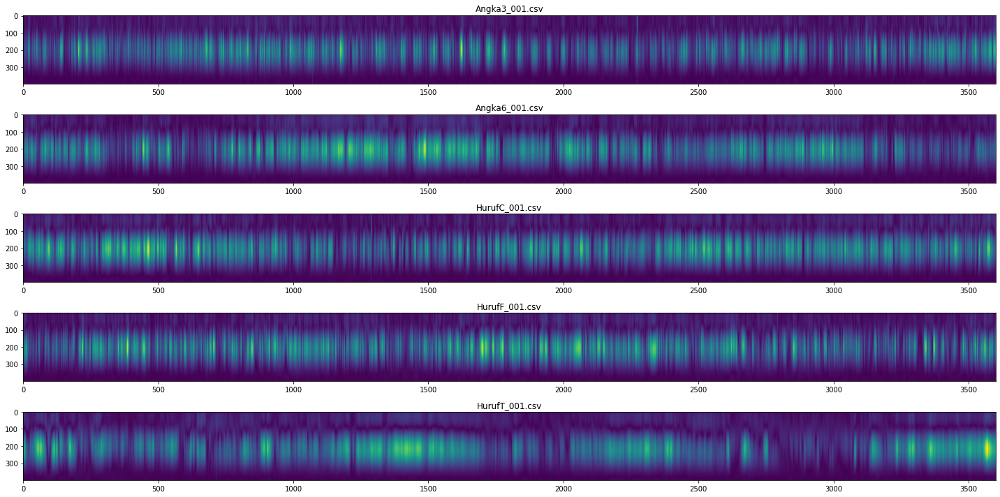

In [ ]:
plot(crop_empatratus,5,1,(20,10),fileNames)

In [ ]:
# plot(crop_empatratus,25,6,(15,30),fileNames)

In [ ]:
# after_fft = np.array(new_data)
# after_new = after_fft[:,:,2048:]
  
# crop_limaratus = after_new[:,:,:400]
# data_cropping = crop(crop_limaratus)

# print(np.shape(data_cropping))


In [ ]:
X = np.reshape(data_cropping,((np.size(data_cropping,0)*np.size(data_cropping,1)),np.size(data_cropping,2),np.size(data_cropping,3)))
print(np.shape(X))

(17780, 400, 45)


In [ ]:
Y = []
for i in range(5):
  Y.extend(i for j in range(int(np.size(X, 0)/5)))
print(Y)
print(np.shape(Y))

# Y = to_categorical(Y)
# print(np.shape(Y))
# print(Y)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
train_x, test_x, train_y, test_y = train_test_split(X, Y, test_size=0.25, random_state=0)
print(np.shape(train_x))
print(np.shape(test_x))
print(np.shape(train_y))
print(np.shape(test_y))

(13335, 400, 45)
(4445, 400, 45)
(13335,)
(4445,)


In [ ]:
train_x = np.reshape(train_x, (np.size(train_x, 0), np.size(train_x, 1), np.size(train_x, 2),1))
test_x = np.reshape(test_x, (np.size(test_x, 0), np.size(test_x, 1), np.size(test_x, 2),1))

print(np.shape(train_x))
print(np.shape(test_x))

(13335, 400, 45, 1)
(4445, 400, 45, 1)


In [ ]:
train_y = to_categorical( train_y )
test_y = to_categorical( test_y )

print(np.shape(test_y))
print(pd.DataFrame(test_y))

(4445, 5)
        0    1    2    3    4
0     1.0  0.0  0.0  0.0  0.0
1     0.0  0.0  0.0  1.0  0.0
2     0.0  0.0  1.0  0.0  0.0
3     0.0  0.0  0.0  0.0  1.0
4     0.0  0.0  1.0  0.0  0.0
...   ...  ...  ...  ...  ...
4440  0.0  0.0  0.0  1.0  0.0
4441  1.0  0.0  0.0  0.0  0.0
4442  0.0  0.0  0.0  1.0  0.0
4443  1.0  0.0  0.0  0.0  0.0
4444  0.0  0.0  1.0  0.0  0.0

[4445 rows x 5 columns]


In [ ]:
# Feature Extraction Layer
inputs = Input(shape=(np.size(train_x, 1), np.size(train_x, 2), 1))
conv_layer = ZeroPadding2D(padding=(2,2))(inputs)
conv_layer = Conv2D(16, (5, 5), strides=(1,1), activation='relu')(conv_layer)
conv_layer = MaxPooling2D((2, 2))(conv_layer)
conv_layer = Conv2D(32, (3, 3), strides=(1,1), activation='relu')(conv_layer)
conv_layer = Conv2D(32, (3, 3), strides=(1,1), activation='relu')(conv_layer)
conv_layer = MaxPooling2D((2, 2))(conv_layer)
conv_layer = Conv2D(64, (3, 3), strides=(1,1), activation='relu')(conv_layer)
conv_layer = Conv2D(64, (3, 3), strides=(1,1), activation='relu')(conv_layer)
conv_layer = Conv2D(128, (3, 3), strides=(1,1), activation='relu')(conv_layer)
conv_layer = MaxPooling2D((2, 2))(conv_layer)

In [ ]:
# Flatten feature map to Vector with 576 element.
flatten = Flatten()(conv_layer)

In [ ]:
# Fully Connected Layer
fc_layer = Dense(256, activation='relu')(flatten)
fc_layer = Dense(64, activation='relu')(fc_layer)
outputs = Dense(5, activation='softmax')(fc_layer)

In [ ]:
model = Model(inputs=inputs, outputs=outputs)

In [ ]:
# Adam Optimizer and Cross Entropy Loss
adam = Adam(lr=0.0001)
model.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


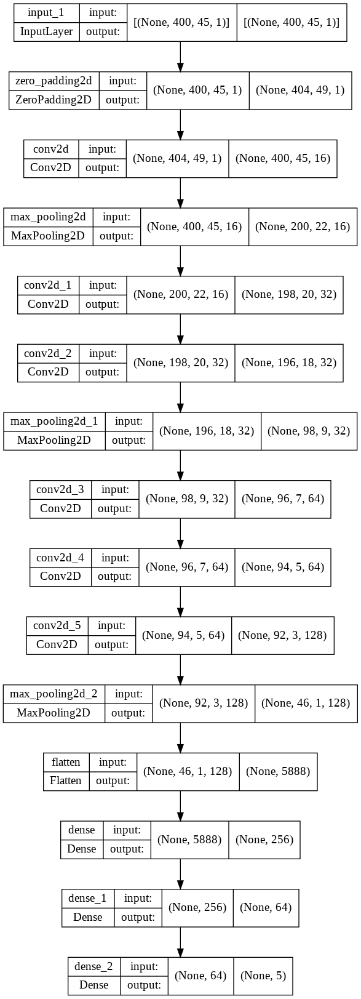

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_plot_6layer.png',show_shapes=True, show_layer_names=True)

In [ ]:
# Print Model Summary
print(model.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 400, 45, 1)]      0         
                                                                 
 zero_padding2d (ZeroPadding  (None, 404, 49, 1)       0         
 2D)                                                             
                                                                 
 conv2d (Conv2D)             (None, 400, 45, 16)       416       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 200, 22, 16)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 198, 20, 32)       4640      
                                                                 
 conv2d_2 (Conv2D)           (None, 196, 18, 32)       9248  

In [ ]:
# Use TensorBoard
callbacks = TensorBoard(log_dir='./Graph3')

In [ ]:
# Train for 100 Epochs and use TensorBoard Callback
H = model.fit(train_x, train_y, batch_size=32, epochs=50, verbose=1, validation_data=(test_x, test_y), callbacks=[callbacks])

Epoch 1/50
417/417 [==============================] - 25s 30ms/step - loss: 0.9321 - accuracy: 0.5992 - val_loss: 0.7617 - val_accuracy: 0.6875
Epoch 2/50
417/417 [==============================] - 9s 22ms/step - loss: 0.5042 - accuracy: 0.8017 - val_loss: 0.4696 - val_accuracy: 0.8090
Epoch 3/50
417/417 [==============================] - 9s 22ms/step - loss: 0.4109 - accuracy: 0.8348 - val_loss: 0.4287 - val_accuracy: 0.8182
Epoch 4/50
417/417 [==============================] - 9s 21ms/step - loss: 0.3708 - accuracy: 0.8514 - val_loss: 0.3752 - val_accuracy: 0.8511
Epoch 5/50
417/417 [==============================] - 9s 22ms/step - loss: 0.3321 - accuracy: 0.8634 - val_loss: 0.3370 - val_accuracy: 0.8628
Epoch 6/50
417/417 [==============================] - 9s 23ms/step - loss: 0.2942 - accuracy: 0.8847 - val_loss: 0.3073 - val_accuracy: 0.8697
Epoch 7/50
417/417 [==============================] - 10s 23ms/step - loss: 0.2756 - accuracy: 0.8901 - val_loss: 0.2519 - val_accuracy: 0.89

In [ ]:
model_json = model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("weights.h5")

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=Graph3/

<IPython.core.display.Javascript object>

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


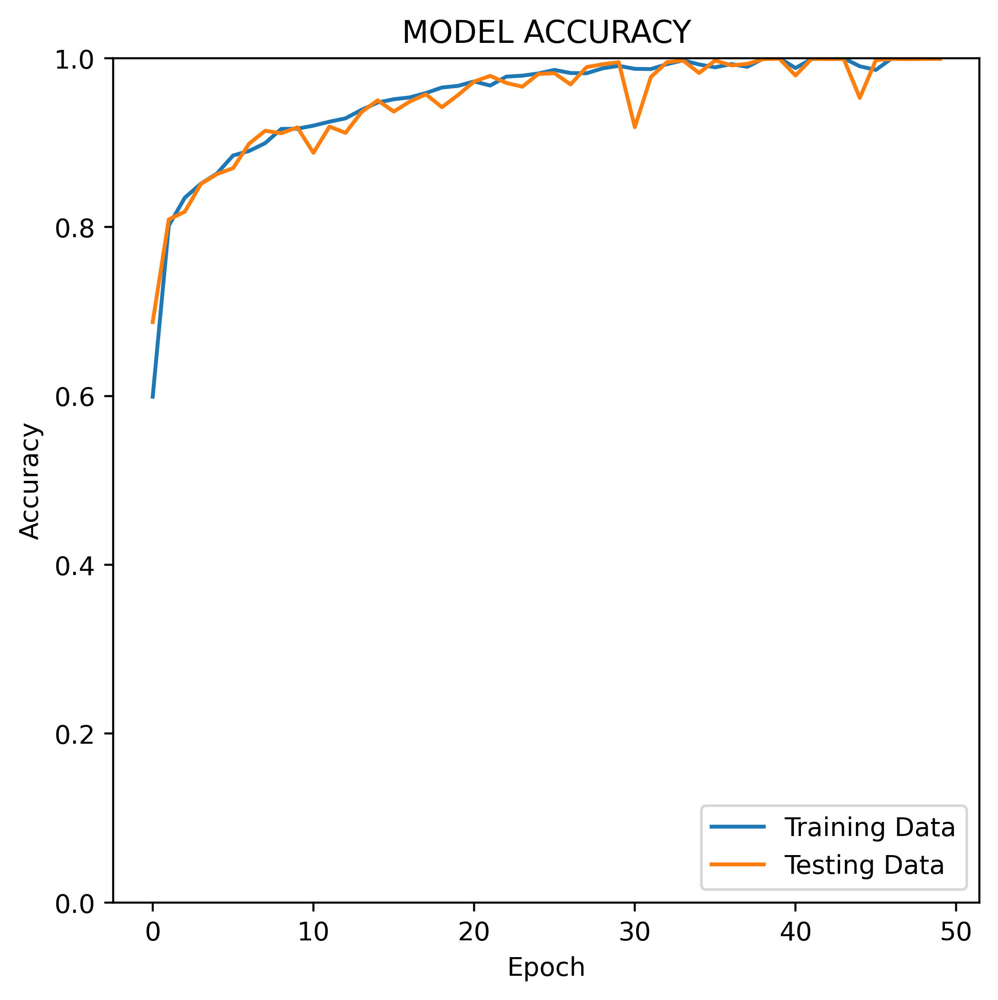

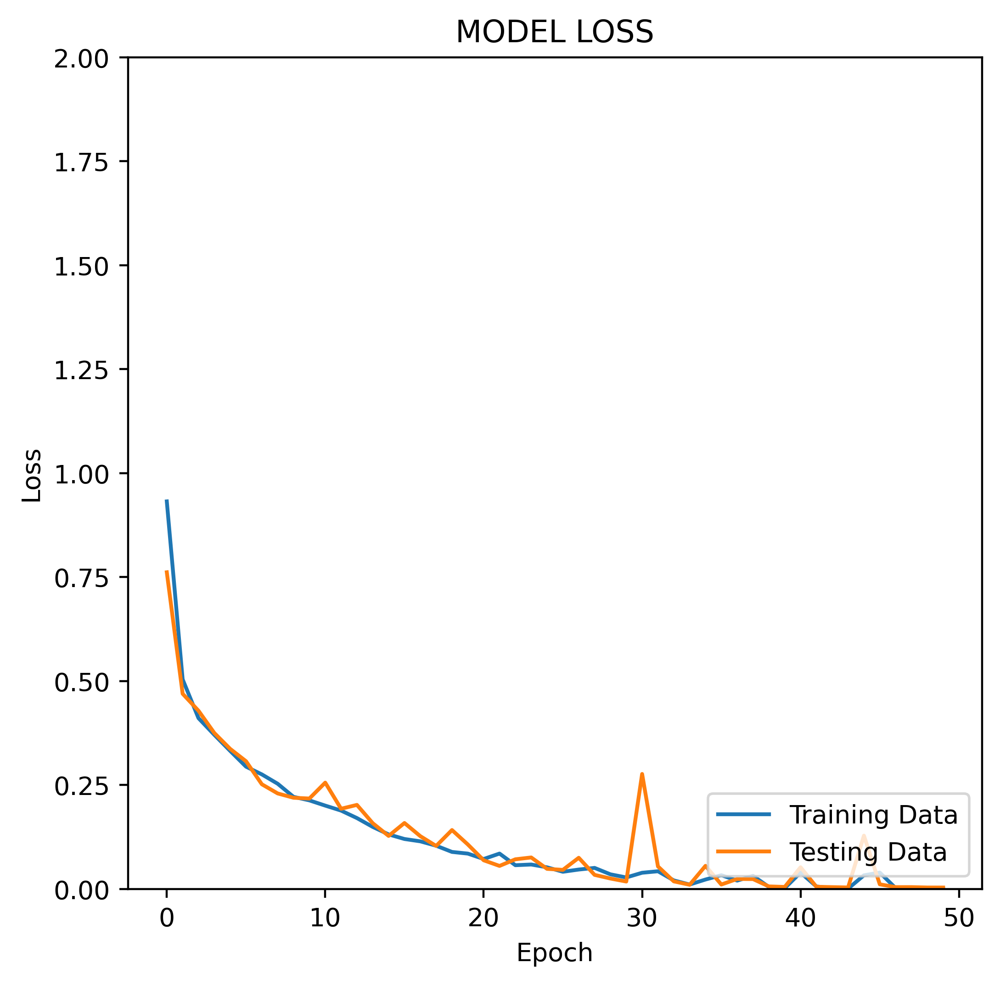

In [ ]:
import matplotlib.pyplot as plt

print(H.history.keys())
f,ax=plt.subplots(figsize=(6,6), dpi=400)
# summarize history for accuracy
plt.plot(H.history['accuracy'])
plt.plot(H.history['val_accuracy'])
plt.title('MODEL ACCURACY')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Training Data', 'Testing Data'], loc='lower right')
X = np.linspace(0, 100, 100)
plt.ylim(0, 1)
plt.savefig('plot_6layernew_1.png')
plt.show()
# summarize history for loss
f,ax=plt.subplots(figsize=(6,6), dpi=400)
plt.plot(H.history['loss'])
plt.plot(H.history['val_loss'])
plt.title('MODEL LOSS')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training Data', 'Testing Data'], loc='lower right')
X = np.linspace(0, 100, 100)
plt.ylim(0, 2)
plt.savefig('plot_6layernew_2.png')
plt.show()

In [ ]:
# evaluate the network
target_names=['Angka 3','Angka 6', 'Huruf C','Huruf F','Huruf T']
prediksi = model.predict(test_x, batch_size=64)
convert_prediksi = prediksi*100
print(convert_prediksi)
print(classification_report(test_y.argmax(axis=1),
prediksi.argmax(axis=1), target_names=target_names))

[[9.9996269e+01 1.0193754e-03 2.7028965e-03 3.7151408e-06 3.1570633e-16]
 [8.5334273e-10 5.3765085e-02 1.1133164e-06 9.9946228e+01 6.4629443e-13]
 [3.7470298e-05 3.4945078e-09 9.9997940e+01 2.0045582e-03 2.3380520e-05]
 ...
 [2.9855437e-07 1.5424303e-02 3.8218984e-11 9.9984573e+01 1.3236099e-14]
 [1.0000000e+02 1.2774015e-08 2.2468571e-20 8.4442604e-07 5.3700474e-26]
 [2.6253598e-12 8.9077368e-09 9.9999985e+01 8.5404135e-06 7.5175333e-10]]
              precision    recall  f1-score   support

     Angka 3       1.00      1.00      1.00       846
     Angka 6       1.00      1.00      1.00       886
     Huruf C       1.00      1.00      1.00       923
     Huruf F       1.00      1.00      1.00       903
     Huruf T       1.00      1.00      1.00       887

    accuracy                           1.00      4445
   macro avg       1.00      1.00      1.00      4445
weighted avg       1.00      1.00      1.00      4445



In [ ]:
model.evaluate(test_x, test_y)

139/139 [==============================] - 1s 9ms/step - loss: 0.0036 - accuracy: 0.9991


[0.003580012358725071, 0.9991000890731812]

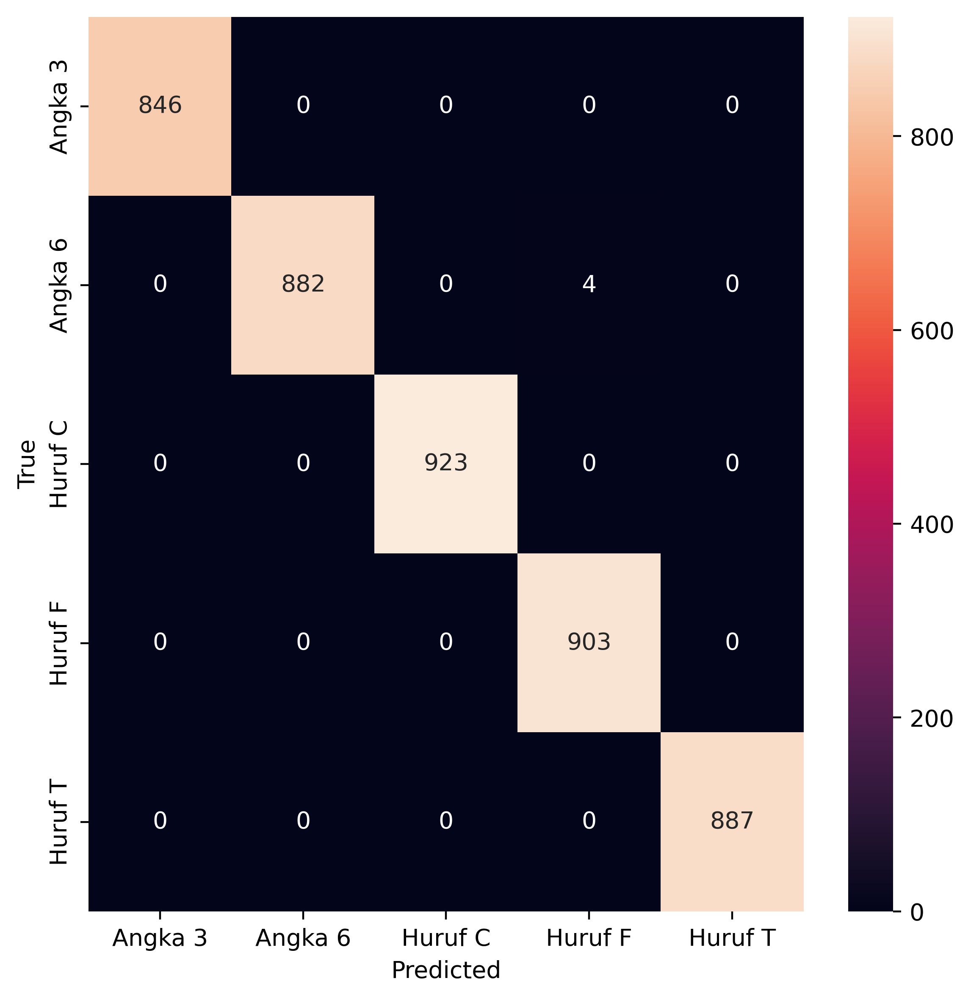

In [ ]:
confusion_matrix = metrics.confusion_matrix(test_y.argmax(axis=1),prediksi.argmax(axis=1))
x_axis_labels = ['Angka 3','Angka 6', 'Huruf C','Huruf F','Huruf T']
y_axis_labels = ['Angka 3','Angka 6', 'Huruf C','Huruf F','Huruf T']
f,ax=plt.subplots(figsize=(6,6), dpi=400)
sn.heatmap(confusion_matrix, xticklabels=x_axis_labels, yticklabels=y_axis_labels, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.savefig('plot_6layernew_3.png')
plt.show()

In [ ]:
# cv = KFold(n_splits=10, random_state=1, shuffle=True)
# score = cross_val_score(model,X_test,Y_test,cv=cv, n_jobs=-1 )